<a id="3"></a>

<h1 style="background-color:red;font-family:newtimeroman;font-size:250%;text-align:center;border-radius: 15px 50px;">Sentiment Analysis of Pfizer COVID 19 Vaccince</h1> 


From the previous presentation of pfizer covid 19 vaccince, the explicity analysis of the data presentation as been done, leaving behind the text analysis. In this notebook, sentiment analysis of tweets extracted on pfizer covid 19 vaccince was analyzed and the users opinion were represented in a statistical descriptive manner.  

- **Table of Content** 
  - Library to Use
  - Read in the Data set 
  - Drop Some Features 
  - Clean text/ Preprocessing 
  - Sentiment Analysis Vader
  - Data Visualization
   

<a id="3"></a>

<h1 style="background-color:red;font-family:newtimeroman;font-size:250%;text-align:center;border-radius: 15px 50px;">Library To Use</h1> 


In [113]:
#Library to Use 
import pandas as pd 
import numpy as np
import seaborn as sns
from nltk.corpus import stopwords
import re 
from nltk.stem.porter import PorterStemmer
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
import matplotlib.pyplot as plt
import seaborn as sns 
sns.set_style('darkgrid')
%matplotlib inline 
import warnings
warnings.filterwarnings('ignore')
from nltk.sentiment.vader import SentimentIntensityAnalyzer as SIA
import nltk
nltk.download('vader_lexicon')
#Advance Data Visualization 
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import plotly.offline as py
from plotly.offline import init_notebook_mode, iplot
from plotly import tools
init_notebook_mode(connected = True)
import plotly.figure_factory as ff
import plotly.io as pio
import plotly.express as px
import plotly.graph_objects as go

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     C:\Users\LENOVO\AppData\Roaming\nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


In [20]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
pd.set_option('display.max_colwidth', None)
pd.set_option('display.width', None)

<a id="3"></a>

<h1 style="background-color:red;font-family:newtimeroman;font-size:250%;text-align:center;border-radius: 15px 50px;">Read In the Data Set/Dropping of Un-Used Columns</h1> 

**Note**
The data Set from the previous note extract from tweet on pfizer covid 19 vaccine was saved for future purpose. Hence, the saved data was read into this note for sentiment analysis since we considering the same topic (**Pfizer COVID-19 Vaccine**) for sentiment analysis 

In [13]:
#Read the data set in using pd.csv()
df = pd.read_csv('tweet_extract2.csv', parse_dates= ['user_date'])

In [14]:
#drop the unmamed: 0 columns that represent index apart from the default index cause its not needed
df.drop('Unnamed: 0', axis = 1, inplace = True)

In [15]:
# The top 5 rows of the data was display to have brief view of the data set at glance 
df.head ()

,user_name,user_date,text,favorite_count,location,sources,followers,ver_acct
0,Jeff Smith,2021-04-13 11:18:34,RT @dawnymock: I see it’s going around with si...,6031,Charlottetown PEI Canada,Twitter Web App,4891,False
1,WDP,2021-04-13 11:18:33,An important milestone for our client Movianto...,718,Benelux - France - Romania,Twitter Web App,767,False
2,rm,2021-04-13 11:17:51,RT @surajbrf: Think SII is doing badly ? Compa...,14678,"Dehradun, Uttaranchal",TweetDeck,491,False
3,rm,2021-04-13 11:17:32,RT @surajbrf: So far we have been fortunate. E...,14678,"Dehradun, Uttaranchal",TweetDeck,491,False
4,Dr Rahul Salunke,2021-04-13 11:15:55,"RT @OpIndia_com: Pfizer wanted Brazil, Argenti...",11952,NaN,Twitter Web App,229,False


In [16]:
# Information about the Data Set 
df.info ()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 8 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   user_name       5000 non-null   object        
 1   user_date       5000 non-null   datetime64[ns]
 2   text            5000 non-null   object        
 3   favorite_count  5000 non-null   int64         
 4   location        3492 non-null   object        
 5   sources         4930 non-null   object        
 6   followers       5000 non-null   int64         
 7   ver_acct        5000 non-null   bool          
dtypes: bool(1), datetime64[ns](1), int64(2), object(4)
memory usage: 278.4+ KB


In [18]:
#Drop the unecessary Colunms that are not part of text sentiment analysis 
#We dropping (user_date,followers,ver_acct,sources)
df_text = df.drop(['user_date','followers','ver_acct','sources'], axis = 1)

In [19]:
#display the top 5 row of the data set after some minor cleaning
df_text.head ()

,user_name,text,favorite_count,location
0,Jeff Smith,RT @dawnymock: I see it’s going around with si...,6031,Charlottetown PEI Canada
1,WDP,An important milestone for our client Movianto...,718,Benelux - France - Romania
2,rm,RT @surajbrf: Think SII is doing badly ? Compa...,14678,"Dehradun, Uttaranchal"
3,rm,RT @surajbrf: So far we have been fortunate. E...,14678,"Dehradun, Uttaranchal"
4,Dr Rahul Salunke,"RT @OpIndia_com: Pfizer wanted Brazil, Argenti...",11952,NaN


In [26]:
#display the last 5 row of the data set after some minor cleaning
df_text.tail(20)

,user_name,text,favorite_count,location
4980,▼ futuroerahoy,"RT @Reuters_Health: The coronavirus variant discovered in South Africa can ""break through"" Pfizer/BioNTech's COVID-19 vaccine to some exten…",5611,"2h, 22m, 11s, 12h 26m 57s"
4981,🌍🇺🇸 🇿🇦 🇺🇳🇯🇲NEWS - HEALTH - GENERAL🇧🇷,@miamalan @Kerotse_K Please exlain why South Africa is buying up Pfizer when it's not effective?\n\nhttps://t.co/KyHTRk9Dh4,25447,South Africa
4982,forensicchick,"RT @nytimes: Dr. Katalin Kariko, known to colleagues as Kati, has emerged as one of the heroes of Covid-19 vaccine development. Her work wi…",2071,Canada
4983,Alra,RT @verge: People who got the Moderna COVID-19 vaccine say they have more side effects https://t.co/22rvvoKRyA https://t.co/BPUWSwsuBp,11353,
4984,PeterCoNet✊️🇭🇰🌸🍁🗽😷,"RT @EpochTimes: People who received the #Moderna COVID-19 #Vaccine reported more side effects than those who got the #Pfizer shot, accordin…",22491,
4985,Tired Sapho🏳️‍🌈,"RT @nytimes: Dr. Katalin Kariko, known to colleagues as Kati, has emerged as one of the heroes of Covid-19 vaccine development. Her work wi…",68974,United States
4986,frank disler,"RT @voxdotcom: No, Johnson &amp; Johnson isn't ""worse"" than the Pfizer/BioNTech Covid-19 vaccine.\n\nThis video explains why you can't judge them…",161131,United States
4987,Muhamamd Waqas,"RT @omar_quraishi: The coronavirus variant discovered in South Africa can ""break through"" Pfizer/BioNTech's COVID-19 vaccine to some extent…",3801,Islamabad
4988,That_A_Boy,"RT @Jay_USMC2: The coronavirus variant discovered in S. Africa can “break through” Pfizer/BioNTech’s COVID-19 vaccine to some extent, a rea…",44812,
4989,Anna Anthro,"RT @TheEconomist: If the AstraZeneca vaccine matches Pfizer’s efficacy, which now appears likely, it could play a leading role in ending th…",46732,Montréal. Tio’tia:ke.


### Inspection of NaN
This section inspect the presence of nan in the data set, in order to avoid a spurious analysis 

In [21]:
# defining a function for Missing Value count and percentage 
'''
input : data 
output: columns with Missing values (count and percentage)
'''
def missing_data(data):
    total = data.isnull().sum()# assign a variable to overall total number of null value in the data set 
    percent = (data.isnull().sum()/data.isnull().count()*100) # calculate the percentage and assign to variable 'percent'
    tt = pd.concat([total, percent], axis=1, keys=['Total', 'Percent']) #create a dataFrame that concat 'total'and 'percent'
    types = [] # create an empty set 
    for col in data.columns:#loop through all the columns 
        dtype = str(data[col].dtype) #assign type of each column to dtype 
        types.append(dtype)
    tt['Types'] = types
    return(np.transpose(tt)) 

In [22]:
missing_data(df_text)

,user_name,text,favorite_count,location
Total,0,0,0,1508
Percent,0,0,0,30.16
Types,object,object,int64,object


In [24]:
# Replace NaN with space 
df_text = df_text.fillna('')

In [25]:
# fill the NaN 
df_text.isnull().any()

user_name         False
text              False
favorite_count    False
location          False
dtype: bool

<a id="3"></a>

<h1 style="background-color:red;font-family:newtimeroman;font-size:250%;text-align:center;border-radius: 15px 50px;">Text Preprocessing</h1>

- ** Text Preprocessing** 
**Text Preprocessing** is traditionally an important step for Natural Language Processing (NLP) tasks. It transforms text into a more digestible form so that machine learning algorithms can perform better.
The text preprocessing carried in this note are stated below: 
 1. **Removing URL** Links starting with "http" or "https" or "www" 
 2. **Removing Twitter Handling** 
 3. **Removing Single word**
 4. **lower casing**
 5. **Removing the Hastag**
 6. **Removing non Alphabet** 

In [56]:
# define a function that will clean the tweets 
'''
input: data containing tweet to be cleaned 
output: cleaned text data
'''
def clean_tweet(tweet):
    tweet = str(tweet).lower()
    tweet = re.sub(r'https?:/\/\S+|www\.\S+','', tweet) #remove url
    tweet = re.sub(r'\B#\S+','',tweet)#remove hastags
    tweet = re.sub('@[^\s]+','',tweet)#remove @mentions
    tweet = re.sub(r'\s+[a-zA-Z0-9]\s+','',tweet)# remove single statement
    tweet = re.sub('RT','', tweet)#remove retweets
    tweet = re.sub('\[.*?\]', '', tweet) #remove text in square brackets
    tweet = re.sub('<.*?>+', '', tweet)#remove punctuaction 
    tweet = re.sub(r'\s+', ' ', tweet, flags=re.I) #remove double space 
    return (tweet)
  

In [57]:
#Apply the Function to of text cleaning to tweet by creating a new column for it
df_text['cl_tweet'] = df_text['text'].apply(lambda x: clean_tweet(x))

In [65]:
# top 5 row of the data set after the cleaning using function 'clean_tweet' for glance view 
df_text.head(5)

,user_name,text,favorite_count,location,cl_tweet
0,Jeff Smith,RT @dawnymock: I see it’s going around with signature cropped....so here is the original:) #covid 19 #vaccine #pfizer #moderna #AstraZenica…,6031,Charlottetown PEI Canada,see it s going around with signature cropped so here is the original 19
1,WDP,"An important milestone for our client Movianto and for the Netherlands in general. Next to the Pfizer, Moderna and… https://t.co/J8tBSUc57o",718,Benelux - France - Romania,An important milestone for our client Movianto and for the Netherlands in general Next to the Pfizer Moderna and
2,rm,"RT @surajbrf: Think SII is doing badly ? Compared to their 270m production by end March, Pfizer, Moderna, JJ committed to a combined 240m b…",14678,"Dehradun, Uttaranchal",Think SII is doing badly Compared to their 270m production by end March Pfizer Moderna JJ committed tocombined 240m b
3,rm,RT @surajbrf: So far we have been fortunate. EU bought half of Pfizer production only to be massively delayed: https://t.co/DTAAiVx320 . Pf…,14678,"Dehradun, Uttaranchal",So far we have been fortunate EU bought half of Pfizer production only to be massively delayed Pf
4,Dr Rahul Salunke,"RT @OpIndia_com: Pfizer wanted Brazil, Argentina to put military bases, Federal reserve as collateral: Why India kept Pfizer away and how t…",11952,,Pfizer wanted Brazil Argentina to put military bases Federal reserve as collateral Why India kept Pfizer away and how t


In [139]:
df_text.cl_tweet[:20]

0                                                                see itgoing around with signature cropped so here is the original
1                 an important milestone for our client movianto and for the netherlands in general next to the pfizer moderna and
2                  think sii is doing badly compared to their m production by end march pfizer moderna jj committed tocombined m b
3                                so far we have been fortunate eu bought half of pfizer production only to be massively delayed pf
4          pfizer wanted brazil argentina to put military bases federal reserve as collateral why india kept pfizer away and how t
5     while breakthrough covid cases people who get infected or sick despite being vaccinated are extremely rare health experts ha
6             israel has had great success with its covid vaccination program after gettinghead start by agreeing to share data wi
7                                       vaccine appointments are available at walgr

In [215]:
#save the cleaned data set 
df_text.to_csv('sent_data.csv')

**Report:** In the above code cells, we preprocess the text feature of our dataset, which contains the tweet's body.

Our goal is to perform the sentiment analysis on clean text data to avoid noise

<a id="3"></a>

<h1 style="background-color:red;font-family:newtimeroman;font-size:250%;text-align:center;border-radius: 15px 50px;">Vader Sentiment Analysis</h1>

After the text preprocessing of the tweet content of pfizer covid 19, we further our analysis by using Vader sentiment analysis scores to analyze the opinon of user, categoryzing the Opinon into 'Positive','Negative',and 'Neutral'

In [69]:
#defining a function for getting negative, positive, neutral, and compound score of vader sentiment analysis 
sid = SIA ()
# getting only the negative score
def negative_score(text):
    negative_value = sid.polarity_scores(text)['neg']
    return negative_value

# getting only the neutral score
def neutral_score(text):
    neutral_value = sid.polarity_scores(text)['neu']
    return neutral_value

# getting only the positive score
def positive_score(text):
    positive_value = sid.polarity_scores(text)['pos']
    return positive_value

# getting only the compound score
def compound_score(text):
    compound_value = sid.polarity_scores(text)['compound']
    return compound_value

In [70]:
#obtaning the four vader score of the tweet on pfizer covid 19 vaccince 
df_text['sent_neg'] = df_text['cl_tweet'].apply(negative_score)# create a new column for negative score
df_text['sent_neu'] = df_text['cl_tweet'].apply(neutral_score)# create a new column for neutral score
df_text['sent_pos'] = df_text['cl_tweet'].apply(positive_score)# create a new column for positive score
df_text['sent_comp'] = df_text['cl_tweet'].apply(compound_score)# create a new column for compound score

In [104]:
#last 5 row of the data set after vader score 
df_text.tail ()

,user_name,text,favorite_count,location,cl_tweet,sent_neg,sent_neu,sent_pos,sent_comp,sentiment
4995,River (they/them) 🏳️‍⚧️🏳️‍🌈🗽🩸🦷✡️,"RT @voxdotcom: No, Johnson &amp; Johnson isn't ""worse"" than the Pfizer/BioNTech Covid-19 vaccine.\n\nThis video explains why you can't judge them…",208405,"Boston, MA",No Johnson amp Johnson isn t worse than the Pfizer BioNTech Covid 19 vaccine This video explains why you can t judge them,0.218,0.782,0.0,-0.6486,negative
4996,LesRhoads🌊🌊🌊,"RT @Jay_USMC2: The coronavirus variant discovered in S. Africa can “break through” Pfizer/BioNTech’s COVID-19 vaccine to some extent, a rea…",216957,Bremerton WA,The coronavirus variant discovered in S Africa can break through Pfizer BioNTech s COVID 19 vaccine to some extent rea,0.000,1.000,0.0,0.0000,Neutral
4997,"Norby, Truth Seeking Dragon of the Southern Lands","RT @voxdotcom: No, Johnson &amp; Johnson isn't ""worse"" than the Pfizer/BioNTech Covid-19 vaccine.\n\nThis video explains why you can't judge them…",392267,🌎of Mystery,No Johnson amp Johnson isn t worse than the Pfizer BioNTech Covid 19 vaccine This video explains why you can t judge them,0.218,0.782,0.0,-0.6486,negative
4998,CO Vax Alerts,"New availability: Centura\nDicks Sporting Goods Park Lot H (Pfizer Vaccine): 6000 Victory Way, Commerce City, CO 800… https://t.co/feP5CfRIs3",222,,New availability Centura Dicks Sporting Goods Park Lot Pfizer Vaccine 6000 Victory Way Commerce City CO 800,0.000,1.000,0.0,0.0000,Neutral
4999,Tissyana Camacho,"RT @voxdotcom: No, Johnson &amp; Johnson isn't ""worse"" than the Pfizer/BioNTech Covid-19 vaccine.\n\nThis video explains why you can't judge them…",4868,,No Johnson amp Johnson isn t worse than the Pfizer BioNTech Covid 19 vaccine This video explains why you can t judge them,0.218,0.782,0.0,-0.6486,negative


**VADER** (Valence Aware Dictionary for Sentiment Reasoning) is a model used for text sentiment analysis that is sensitive to both polarity (positive/negative) and intensity (strength) of emotion. It produce four sentment metrics scores namely: positive, negative, neutral and compound. 
**VADER sentimental analysis** relies on a dictionary that maps lexical features to emotion intensities known as sentiment scores. The sentiment score of a text can be obtained by summing up each word's intensity in the text.

In [89]:
import random
plt.rc('figure',figsize=(17,13))

In [87]:
df_text.columns

Index(['user_name', 'text', 'favorite_count', 'location', 'cl_tweet',
       'sent_neg', 'sent_neu', 'sent_pos', 'sent_comp'],
      dtype='object')

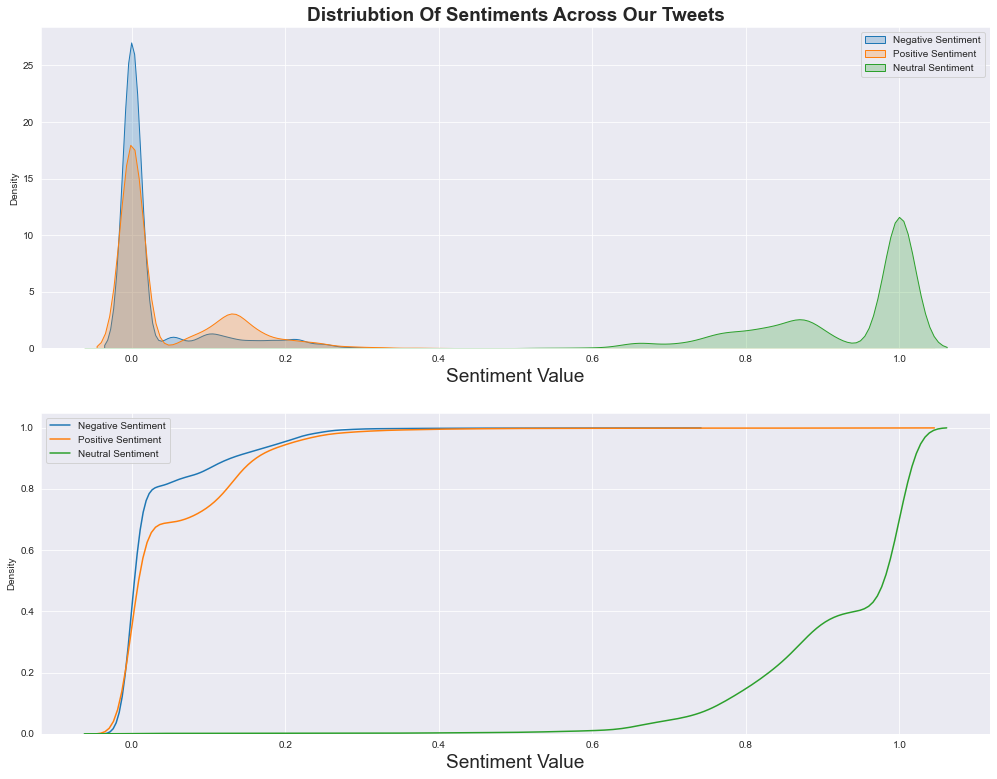

In [103]:
# ploting the kernel Density function of the sentiment Scores 
plt.subplot(2,1,1)
plt.title('Distriubtion Of Sentiments Across Our Tweets',fontsize=19,fontweight='bold')
sns.kdeplot(df_text['sent_neg'],shade=True)
sns.kdeplot(df_text['sent_pos'],shade=True)
sns.kdeplot(df_text['sent_neu'],shade=True)
plt.xlabel('Sentiment Value',fontsize=19)
plt.legend (labels = ['Negative Sentiment','Positive Sentiment','Neutral Sentiment'])
plt.subplot(2,1,2)
sns.kdeplot(df_text['sent_neg'],cumulative=True)
sns.kdeplot(df_text['sent_pos'],cumulative=True)
sns.kdeplot(df_text['sent_neu'],cumulative=True)
plt.xlabel('Sentiment Value',fontsize=19)
plt.legend (labels = ['Negative Sentiment','Positive Sentiment','Neutral Sentiment'])
plt.show()


the graph displays the kernel density function of the sentiment scores using Vader sentimant analysis, you can observe that the distributions of the sentiments follow a normal distribution; the negative and positive sentiments are very similar, proposing that there may be no significant differences in the strength of our data's positive and negative sentiments.

It is also clear that the dominant sentiment is neutral; oddly, most of the tweets do not resemble more positive or negative sentiment rather neutral.

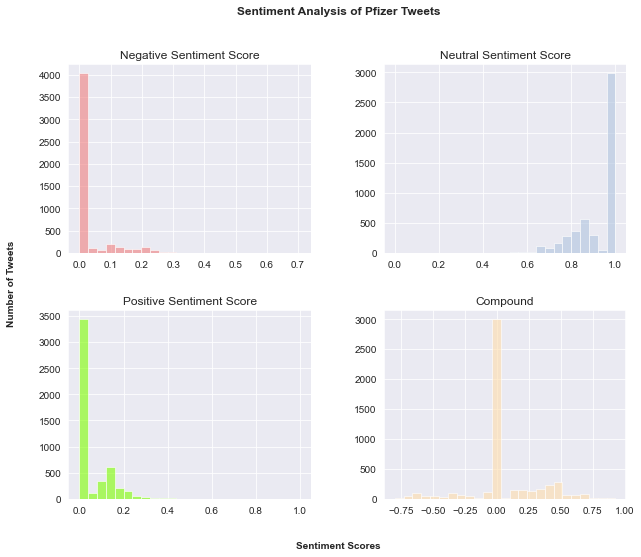

In [91]:
# plot all 4 histograms
fig, axes = plt.subplots(2, 2, figsize=(10,8))
df_text.hist('sent_neg', bins=25, ax=axes[0,0], color='lightcoral', alpha=0.6)
axes[0,0].set_title('Negative Sentiment Score')
df_text.hist('sent_neu', bins=25, ax=axes[0,1], color='lightsteelblue', alpha=0.6)
axes[0,1].set_title('Neutral Sentiment Score')
df_text.hist('sent_pos', bins=25, ax=axes[1,0], color='chartreuse', alpha=0.6)
axes[1,0].set_title('Positive Sentiment Score')
df_text.hist('sent_comp', bins=25, ax=axes[1,1], color='navajowhite', alpha=0.6)
axes[1,1].set_title('Compound')

# plot common x- and y-label
fig.text(0.5, 0.04, 'Sentiment Scores',  fontweight='bold', ha='center')
fig.text(0.04, 0.5, 'Number of Tweets', fontweight='bold', va='center', rotation='vertical')

# plot title
plt.suptitle('Sentiment Analysis of Pfizer Tweets\n\n', fontsize=12, fontweight='bold');

The graph above display the distribution function of the four vader metrics scores in the sentiment analysis of pfizer tweets,The first three - positive, neutral and negative - represent the proportion of the text that falls into those categories.  much attention will be concentrated on the compound scores which is the overall of the three other scores.from the compound chart the range of the distribution is from -1 to 1, with distribution of (0.00) having more occurence of tweets than the other follower by distribution from positive side (0 to 1). this implies that majority of the tweets are Neutral opionins  

In [96]:
#Get the sentiment using the compound score of Vader Sentiment 
df_text['sentiment'] = np.where(df_text['sent_comp'] >0,'positive',np.where(df_text['sent_comp']<0,'negative','Neutral'))

In [98]:
#value counts 
df_text['sentiment'].value_counts ()

Neutral     2997
positive    1374
negative     629
Name: sentiment, dtype: int64

## **SENTIMENT COUNTS**

In [108]:
#this section count the sentiment analysis of the tweet 
temp = df_text.groupby('sentiment').count ()['cl_tweet'].reset_index().sort_values(by='cl_tweet',ascending=False)
temp.style.background_gradient(cmap='Purples')

,sentiment,cl_tweet
0,Neutral,2997
2,positive,1374
1,negative,629


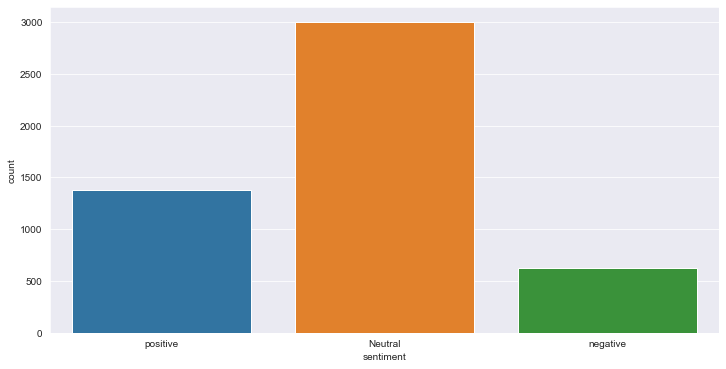

In [109]:
#plot Funel CHart for the Sentiment analysis 
plt.figure(figsize=(12,6))
sns.countplot(x='sentiment',data=df_text)
fig = go.Figure(go.Funnelarea(
    text =temp.sentiment,
    values = temp.cl_tweet,
    title = {"position": "top center", "text": "Funnel-Chart of Sentiment Distribution"}
    ))
fig.show()

**REPORT :**
>>The bars and the Funnel chart display the percentage and counts of postive, neutral, and negative tweets of users on pfizer covid vaccince. from the funnel chart its noted that 59.9% of the tweet are Neutral i.e neither positive nor negative, while 27.5% of the tweets on pfizer are positive, the rest of the percentages are negatives (12.6%). this implies that majority of the tweets were not bad.Hence user view about pfizer covid 19 vaccince are Good in comparison ot it counterpart (AstraZenecas) 

<a id="3"></a>

<h1 style="background-color:red;font-family:newtimeroman;font-size:250%;text-align:center;border-radius: 15px 50px;">Data Visualization</h1>

This section describe all the descriptive graph representation of the sentiment analysis:
1. Frequency Distribution of Most Common Words for Positive, Negative, and Neutral 
2. Worldcloud for Common Postive words, Negative words, Neutral Words
3. Graphical Distribution of the Words 

**MOST COMMON WORD SENTIMENT WISE**

In [133]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\LENOVO\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [466]:
#The code for creating a sentiment columns that group the tweet into positive, negative,and neutral sentiment:
#with condition where sent_comp >0 - positive, sent_comp <0 - negative, sent_comp = 0 - neutral.
import numpy as np
df_text['sentiment'] = np.where(df_text['sent_comp'] > 0, 'positive',np.where(df_text['sent_comp']<0, 'negative','Neutral'))

In [325]:
#Stopswords was remove in this cell using english dictionary from 'Snowballstemmer library'
from nltk.stem import SnowballStemmer
sno = SnowballStemmer('english') #set Snowballstemming to be english
remove_wrd = ['h','ny','jj','dr','wi','ha','ki','g','cli','f','ad']# some common single words that were not proper addressed in the text preprocessing 
stop_words = (set(stopwords.words('english')))
stop_words = remove_wrd + list(stop_words) # create stopwords 

In [158]:
#stopword function 
def remove_stopword(x):
    return [y for y in x if y not in stop_words] #list comprehension for removing stop words 
df_text['twt'] = df_text['cl_tweet'].apply(lambda x:str(x).split()) # we create a columns where the tweets where split, for easy removing of stopword
df_text['twt'] = df_text['twt'].apply(lambda x:remove_stopword(x))# apply the remove stop word function on the new created columns 

In [159]:
#Display the top 10 row of the data set after a lot manipulation has been done to have a coherent glance of what has been done and what was presented 
df_text.head (10)

,user_name,text,favorite_count,location,cl_tweet,sent_neg,sent_neu,sent_pos,sent_comp,sentiment,twt
0,Jeff Smith,RT @dawnymock: I see it’s going around with signature cropped....so here is the original:) #covid 19 #vaccine #pfizer #moderna #AstraZenica…,6031,Charlottetown PEI Canada,see itgoing around with signature cropped so here is the original,0.000,0.839,0.161,0.3182,positive,"[see, itgoing, around, signature, cropped, original]"
1,WDP,"An important milestone for our client Movianto and for the Netherlands in general. Next to the Pfizer, Moderna and… https://t.co/J8tBSUc57o",718,Benelux - France - Romania,an important milestone for our client movianto and for the netherlands in general next to the pfizer moderna and,0.000,0.909,0.091,0.2023,positive,"[important, milestone, client, movianto, netherlands, general, next, pfizer, moderna]"
2,rm,"RT @surajbrf: Think SII is doing badly ? Compared to their 270m production by end March, Pfizer, Moderna, JJ committed to a combined 240m b…",14678,"Dehradun, Uttaranchal",think sii is doing badly compared to their m production by end march pfizer moderna jj committed tocombined m b,0.130,0.669,0.202,0.1860,positive,"[think, sii, badly, compared, production, end, march, pfizer, moderna, committed, tocombined, b]"
3,rm,RT @surajbrf: So far we have been fortunate. EU bought half of Pfizer production only to be massively delayed: https://t.co/DTAAiVx320 . Pf…,14678,"Dehradun, Uttaranchal",so far we have been fortunate eu bought half of pfizer production only to be massively delayed pf,0.091,0.769,0.139,0.2500,positive,"[far, fortunate, eu, bought, half, pfizer, production, massively, delayed, pf]"
4,Dr Rahul Salunke,"RT @OpIndia_com: Pfizer wanted Brazil, Argentina to put military bases, Federal reserve as collateral: Why India kept Pfizer away and how t…",11952,,pfizer wanted brazil argentina to put military bases federal reserve as collateral why india kept pfizer away and how t,0.000,1.000,0.000,0.0000,Neutral,"[pfizer, wanted, brazil, argentina, put, military, bases, federal, reserve, collateral, india, kept, pfizer, away]"
5,ANGELA HUFFMAN,"RT @ABC: While ""breakthrough"" COVID-19 cases—people who get infected or sick despite being vaccinated—are extremely rare, health experts ha…",226099,"TUSKEGEE,ALABAMA",while breakthrough covid cases people who get infected or sick despite being vaccinated are extremely rare health experts ha,0.251,0.656,0.093,-0.6249,negative,"[breakthrough, covid, cases, people, get, infected, sick, despite, vaccinated, extremely, rare, health, experts]"
6,Diamo i numeri 🇪🇺,RT @StatistaCharts: Israel has had great success with its Covid vaccination program after getting a head start by agreeing to share data wi…,79279,"Milano, Lombardia",israel has had great success with its covid vaccination program after gettinghead start by agreeing to share data wi,0.000,0.547,0.453,0.9081,positive,"[israel, great, success, covid, vaccination, program, gettinghead, start, agreeing, share, data]"
7,NYC Vaccine Bot,"Vaccine appointments are available at\n\nWalgreens/Duane Reade (Pfizer)\n541 West 235th Street, Bronx, NY, 10463\n(800)… https://t.co/zDfKkwN8Bd",20,"New York, NY",vaccine appointments are available at walgreens duane reade pfizer west th street bronx ny,0.000,1.000,0.000,0.0000,Neutral,"[vaccine, appointments, available, walgreens, duane, reade, pfizer, west, th, street, bronx]"
8,Gerbil King Lemmiwinks,RT @dawnymock: I see it’s going around with signature cropped....so here is the original:) #covid 19 #vaccine #pfizer #moderna #AstraZenica…,25120,In a onesie watching Spiderman,see itgoing around with signature cropped so here is the original,0.000,0.839,0.161,0.3182,positive,"[see, itgoing, around, signature, cropped, original]"
9,Political Perusal,"RT @ABC: While ""breakthrough"" COVID-19 cases—people who get infected or sick despite being vaccinated—are extremely rare, health experts ha…",46,World,while breakthrough covid cases people who get infected or sick

**Note**
In light of all this manipulation on the tweets, we extract the categories of sentiment considere from the data set . this is done for the sake of clear 
graphical display

In [212]:
#CREATING DATA FRAME FOR POSITIVE, NEGATIVE, AND NEUTRAL sentiment 
positive_sent = df_text[df_text['sentiment']=='positive']
negative_sent = df_text[df_text['sentiment']=='negative']
neutral_sent = df_text[df_text['sentiment']=='Neutral']

In [209]:
from collections import Counter #this library was used for counting the common words
#MosT common positive words
top = Counter([item for sublist in positive_sent['twt'] for item in sublist])
temp_positive = pd.DataFrame(top.most_common(30))
temp_positive.columns = ['Common_words','count']
temp_positive.style.background_gradient(cmap='Greens')

,Common_words,count
0,vaccine,870
1,pfizer,691
2,covid,687
3,study,217
4,effective,192
5,south,174
6,african,163
7,one,150
8,get,150
9,biontech,146


**Report :**
> The Table above display the frequency count of 30 most common words in positive tweets posted by the twitter user on pfizer vaccince, from the table, it was deduce that the top three shaded words which are (**vaccince**,**pfizer**,and **covid**) were the most common words in postive tweets with (874,691,and 687) counts respectively.

In [179]:
# Barchat of most frequent words in positive tweet
fig = px.bar(temp_positive, x="count", y="Common_words", title='Most Frequently Positive Words in Tweet - Top 30', orientation='h', 
             width=700, height=700,color='Common_words')
fig.show()

**Report**
<p style="text-align: center;"><span style='font-family: "Times New Roman", Times, serif; font-size: 24px;'> the above barchart and table display the top 30 frequent words present in the positive tweet, it was noted from the table and backup by the chart that **vaccine**, **pfizer**, and **covid** are the most used words by the user in postive tweet</span></p>
<p style="text-align: center;"><span style="font-size: 24px;"><span style="font-family: 'Times New Roman', Times, serif;"><br></span></span></p>

In [208]:
#MosT common Negative words
top = Counter([item for sublist in negative_sent['twt'] for item in sublist])
temp_negative = pd.DataFrame(top.most_common(30))
temp_negative.columns = ['Common_words','count']
temp_negative.style.background_gradient(cmap='Reds')

,Common_words,count
0,vaccine,343
1,covid,334
2,pfizer,315
3,biontech,94
4,johnson,88
5,emergency,85
6,people,79
7,one,76
8,vaccinated,74
9,use,71


**Report :**
This Table show the frequency count of 30 most common words in negative tweets posted by the twitter user on pfizer coiv 19 vaccince, from the table, it was noted that the top three shaded words in color red which are (vaccince,covid,and pfizer) were the most common words in negative tweets with (343,334,and 315) counts respectively.

In [174]:
#Tree for most Negative words in the tweet
fig = px.treemap(temp_negative, path=['Common_words'], values='count',title='Tree of Most Negative Words in Tweet - Top 30')
fig.show()

## **REPORT**:
>>The report from the tree of most common negative words in the tweet of pfizer, was similarly to the report in the common words of postive with **vaccine**, **covid**, **pfizer** appearing mostly. this report align with the fact drawn from the kernel distribution of the vader sentiment metric ealier stated, where there was no significance difference in the score of positive and negative tweet

In [178]:
#MosT common Neutral words
top = Counter([item for sublist in neutral_sent['twt'] for item in sublist])
temp_neutral = pd.DataFrame(top.most_common(30))
temp_neutral.columns = ['Common_words','count']
temp_neutral.style.background_gradient(cmap='Blues')

,Common_words,count
0,pfizer,2790
1,vaccine,1477
2,covid,909
3,wanted,765
4,kept,764
5,brazil,716
6,federal,716
7,put,715
8,military,715
9,bases,715


## **Report**

>The Report from the table above display the frequency count of 30 most common words in neutral tweets posted by the twitter user on pfizer vaccince, its reported from the table that there more words in neutral sentiment tweets, this align with the report from the graphical representation of sentiment analysis chart where neutral sentiment has higher percentage in comparison with their counter part. Also reported from this table is the first five commmon words in the neutral tweets and it counts namely: 
(**pfizer: 2790**, **vaccine: 1477**, **covid: 909**, **wanted: 765**, **kept: 764**)

In [175]:
#Bar chart of Most Neutral Words in the Tweet 
fig = px.bar(temp_neutral, x="count", y="Common_words", title='Most Commmon Neutral Words inthe Tweet -Top 30', orientation='h', 
             width=700, height=700,color='Common_words')
fig.show()

## **Report: **
>The report of the chart align with the result in the table, the chart diplay the graphical representation of result from the table. with 'pfizer' appearing more (2790) counts, followed by 'vaccine' (1477), 'covid' (909), 'wanted' (765), and 'kept' (764) out of the top 5 words in Neutral.


## **WORDCLOUDS** SENTIMENT WISE
- **Wordclouds for Positive words**
- **Wordclouds for Negative words**
- **Wordsclouds for Neutral words**

In [206]:
#Create a function for plotting wordclouds of Most common Words
def plot_wordcloud(text, mask=None, max_words=200, max_font_size=100, figure_size=(24.0,16.0), color = 'black',
                   title = None, title_size=40, image_color=False):
    stopwords = set(STOPWORDS)
    more_stopwords = {'u', "im",'sil','b','eu','th','pf','dr','jj','h','ny','jj','dr','wi','ha'}
    stopwords = stopwords.union(more_stopwords)

    wordcloud = WordCloud(background_color=color,
                    stopwords = stopwords,
                    max_words = max_words,
                    max_font_size = max_font_size, 
                    random_state = 42,
                    width=400, 
                    height=200,
                    mask = mask)
    wordcloud.generate(str(text))
    
    plt.figure(figsize=figure_size)
    if image_color:
        image_colors = ImageColorGenerator(mask);
        plt.imshow(wordcloud.recolor(color_func=image_colors), interpolation="bilinear");
        plt.title(title, fontdict={'size': title_size,  
                                  'verticalalignment': 'bottom'})
    else:
        plt.imshow(wordcloud);
        plt.title(title, fontdict={'size': title_size, 'color': 'black', 
                                  'verticalalignment': 'bottom'})
    plt.axis('off');
    plt.tight_layout() 
d = '/kaggle/input/masks-for-wordclouds/'

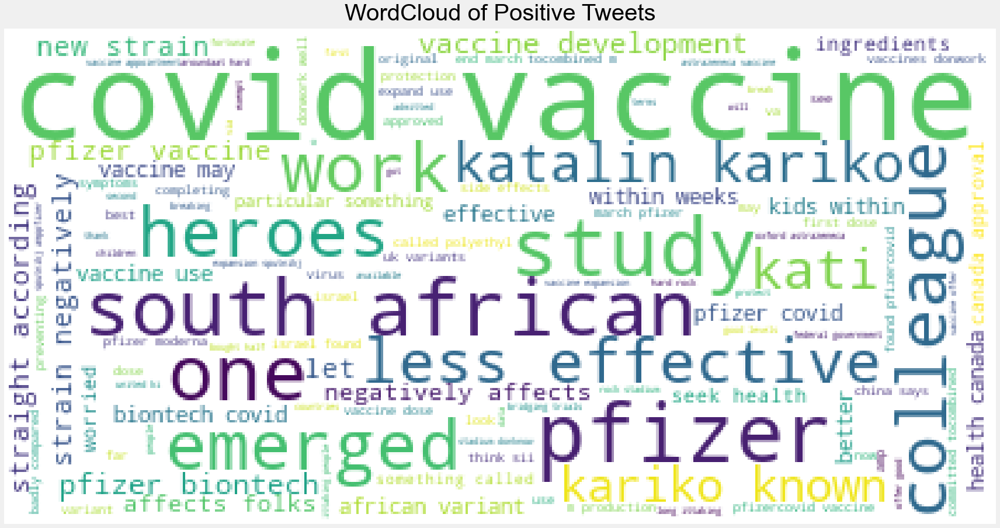

In [213]:
# Wordclouds for Positive tweets words 
plot_wordcloud(positive_sent.cl_tweet,color='white',max_font_size=50,title_size=40,title="WordCloud of Positive Tweets")

## **Report**
>Above cell display the wordclouds of most common words in Positive tweet, it appears that COVID, VACCINCE, EFFECTIVE, PFIZER ONE, HEROES ETC are more predominant in the wordclouds, also other words with bold font occurs more in the positive tweet

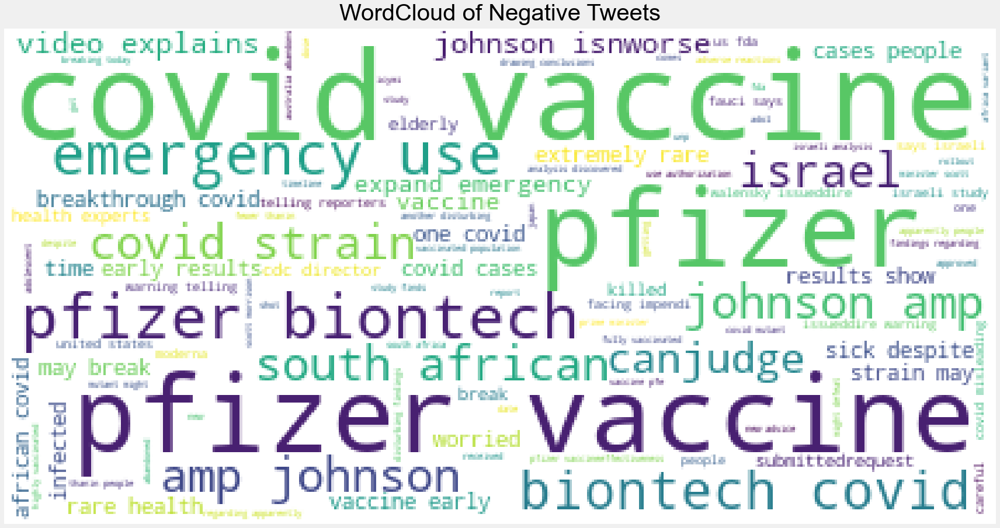

In [467]:
#wordcloud for Negative Tweets 
plot_wordcloud(negative_sent.cl_tweet,color='white',max_font_size=50,title_size=40,title="WordCloud of Negative Tweets")

## **Report :**
> The above cell also displays the most common words in Negative tweet of the user using wordclouds. From the cloud, words with bold font are the predominant words in negative tweets

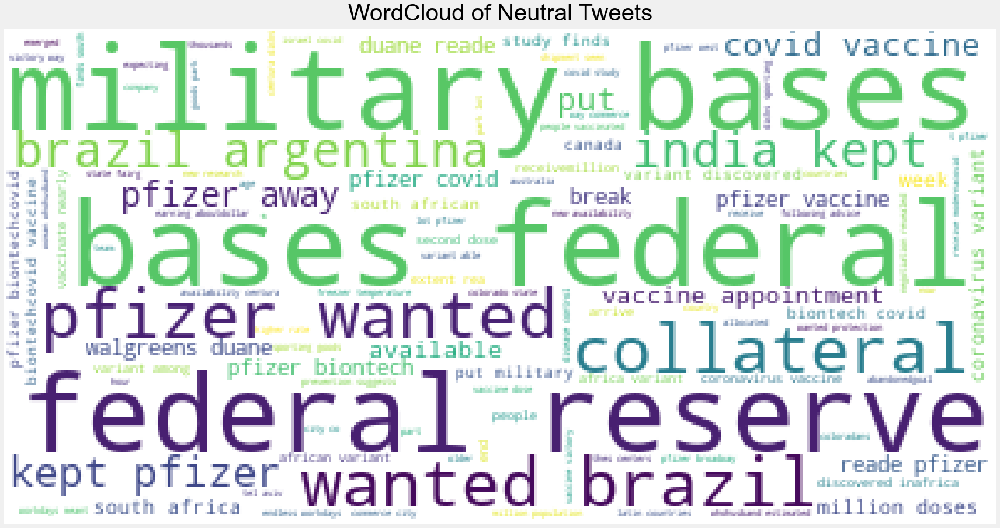

In [205]:
#wordclouds of Neutral Tweets
plot_wordcloud(neutral_sent.cl_tweet,color='white',max_font_size=50,title_size=40,title="WordCloud of Neutral Tweets")

## **Report :**
>The predominant words in Negative tweets were also present in wordclouds format where words with bold font tends to be more commnon in comparison to their counterpart. detail of words more common is highlighted in the table of Common words from Neutral tweets 

## Sentiment Wise for Sources of Tweets on Pfizer Covid 19
The section displays the counts of tweets with respect to there sources under different sentiment, this was done to inspect the sources with most sentiment tweet.
> In light of this the previous data used was also re-read but this time considering other columns like ('user_location','sources','acct_veri') so as to graphically display sentiment categorires by sources, verified account and location.

In [381]:
#read in the data again 
nw_df = pd.read_csv('sent_data.csv', parse_dates=['user_date'])

In [384]:
#Drop the un used columns 
nw_df.drop('Unnamed: 0', axis = 1, inplace = True)

In [222]:
nw_df.fillna('')

,user_name,text,favorite_count,location,cl_tweet,sent_neg,user_date,acct_veri,sources,sent_neu,sent_pos,sent_comp,sentiment,twt
0,Jeff Smith,RT @dawnymock: I see it’s going around with signature cropped....so here is the original:) #covid 19 #vaccine #pfizer #moderna #AstraZenica…,6031,Charlottetown PEI Canada,see itgoing around with signature cropped so here is the original,0.000,2021-12-04 10:09:00,False,Twitter Web App,0.839,0.161,0.3182,positive,"['see', 'itgoing', 'around', 'signature', 'cropped', 'original']"
1,WDP,"An important milestone for our client Movianto and for the Netherlands in general. Next to the Pfizer, Moderna and… https://t.co/J8tBSUc57o",718,Benelux - France - Romania,an important milestone for our client movianto and for the netherlands in general next to the pfizer moderna and,0.000,2021-12-04 10:09:00,False,Twitter Web App,0.909,0.091,0.2023,positive,"['important', 'milestone', 'client', 'movianto', 'netherlands', 'general', 'next', 'pfizer', 'moderna']"
2,rm,"RT @surajbrf: Think SII is doing badly ? Compared to their 270m production by end March, Pfizer, Moderna, JJ committed to a combined 240m b…",14678,"Dehradun, Uttaranchal",think sii is doing badly compared to their m production by end march pfizer moderna jj committed tocombined m b,0.130,2021-12-04 10:08:00,False,TweetDeck,0.669,0.202,0.1860,positive,"['think', 'sii', 'badly', 'compared', 'production', 'end', 'march', 'pfizer', 'moderna', 'committed', 'tocombined', 'b']"
3,rm,RT @surajbrf: So far we have been fortunate. EU bought half of Pfizer production only to be massively delayed: https://t.co/DTAAiVx320 . Pf…,14678,"Dehradun, Uttaranchal",so far we have been fortunate eu bought half of pfizer production only to be massively delayed pf,0.091,2021-12-04 10:06:00,False,TweetDeck,0.769,0.139,0.2500,positive,"['far', 'fortunate', 'eu', 'bought', 'half', 'pfizer', 'production', 'massively', 'delayed', 'pf']"
4,Dr Rahul Salunke,"RT @OpIndia_com: Pfizer wanted Brazil, Argentina to put military bases, Federal reserve as collateral: Why India kept Pfizer away and how t…",11952,,pfizer wanted brazil argentina to put military bases federal reserve as collateral why india kept pfizer away and how t,0.000,2021-12-04 10:06:00,False,Twitter Web App,1.000,0.000,0.0000,Neutral,"['pfizer', 'wanted', 'brazil', 'argentina', 'put', 'military', 'bases', 'federal', 'reserve', 'collateral', 'india', 'kept', 'pfizer', 'away']"
5,ANGELA HUFFMAN,"RT @ABC: While ""breakthrough"" COVID-19 cases—people who get infected or sick despite being vaccinated—are extremely rare, health experts ha…",226099,"TUSKEGEE,ALABAMA",while breakthrough covid cases people who get infected or sick despite being vaccinated are extremely rare health experts ha,0.251,2021-12-04 10:06:00,False,Twitter for Android,0.656,0.093,-0.6249,negative,"['breakthrough', 'covid', 'cases', 'people', 'get', 'infected', 'sick', 'despite', 'vaccinated', 'extremely', 'rare', 'health', 'experts']"
6,Diamo i numeri 🇪🇺,RT @StatistaCharts: Israel has had great success with its Covid vaccination program after getting a head start by agreeing to share data wi…,79279,"Milano, Lombardia",israel has had great success with its covid vaccination program after gettinghead start by agreeing to share data wi,0.000,2021-12-04 10:04:00,False,Twitter Web App,0.547,0.453,0.9081,positive,"['israel', 'great', 'success', 'covid', 'vaccination', 'program', 'gettinghead', 'start', 'agreeing', 'share', 'data']"
7,NYC Vaccine Bot,"Vaccine appointments are available at\n\nWalgreens/Duane Reade (Pfizer)\n541 West 235th Street, Bronx, NY, 10463\n(800)… https://t.co/zDfKkwN8Bd",20,"New York, NY",vaccine appointments are available at walgreens duane reade pfizer west th street bronx ny,0.000,2021-12-04 10:01:00,False,NYC Vaccine Bot,1.000,0.000,0.0000,Neutral,"['vaccine', 'appointments', 'available', 'walgreens', 'duane', 'reade', 'pfizer', 'west', 'th', 'street', 'bronx']"
8,Gerbil King Lemmiwinks,RT @dawnymock: I see it’s going around wi

In [224]:
# Inspect the counts value of sources 
nw_df['sources'].value_counts()[:10]

Twitter for Android    1366
Twitter for iPhone     1365
Twitter Web App        1272
NYC Vaccine Bot         271
Twitter for iPad        168
TweetDeck                88
dlvr.it                  59
True Anthem              44
Hootsuite Inc.           33
WordPress.com            31
Name: sources, dtype: int64

In [227]:
#Create a data set that is group by sources and sentiment on clean tweet using groupby () function from the previous data
sourc = nw_df.groupby(['sources','sentiment']).count () ['cl_tweet'].reset_index() #create the data using groupby 
sourc = pd.DataFrame(sourc)#put the data in dataframe
sourc.columns= ['sources','sentiment','count']#rename the columns
sourc = sourc.sort_values(by = 'count',ascending = False)#sort the data descending order
#due to ambiguty of the data, so we decided to extract data with count greater than equal to 7
sourc = sourc[sourc['count']>=7]

In [243]:
#display the data created 
sourc

,sources,sentiment,count
107,Twitter for Android,Neutral,904
115,Twitter for iPhone,Neutral,776
103,Twitter Web App,Neutral,680
117,Twitter for iPhone,positive,406
105,Twitter Web App,positive,406
109,Twitter for Android,positive,306
45,NYC Vaccine Bot,Neutral,260
104,Twitter Web App,negative,183
116,Twitter for iPhone,negative,181
108,Twitter for Android,negative,156


In [245]:
#plot bar chat for the postive tweet base on sources 
fig = px.bar(sourc[sourc["sentiment"] == 'positive'], x ="count",y="sources",color="sources",text="count",title="Source with Positive Tweets")
fig.update_traces(textposition='outside')
fig.show()

## **Report :**
>The reported bar chart above display the top resources with positive tweets, from the report its noted that source from Iphone and WebApp are the most sources for positive tweets with equal counts, followed by sources from andriod with (306) counts and also sources Ipad (54) counts  

In [248]:
#plot bar chat for the postive tweet base on sources 
fig = px.bar(sourc[sourc["sentiment"] == 'negative'], x ="count",y="sources",color="sources",text="count",title="Source with Negative Tweets")
fig.update_traces(textposition='outside')
fig.show()

## **Report :**
> The report from the chart shows only five sources of Negative tweets, with Webapp as the sources with more Negative tweets follwed by sources from iphone and Android having 181 and 156 count each respectively.

In [250]:
#plot bar chat for the postive tweet base on sources 
fig = px.bar(sourc[sourc["sentiment"] == 'Neutral'], x ="count",y="sources",color="sources",text="count",title="Source with Neutral Tweets")
fig.update_traces(textposition='outside')
fig.show()

## **Report :**
>The bar chart above is the graphical representation of source with most Neutral tweets, from the chart tweets from Andriod are more Neutral with 904 counts compare to others followed by iphone with (776) counts, WebApp with 680 counts, also NYC vaccince Bot with 260 counts, while the rest are within the range of 100 counts 


## Sentiment Wise Words of Verified Twitter Account
This section present the sentiment analysis of words from veried account for different categories of sentiments 
- Positive 
- Negative 
- Neutral

Note: After reading the data in again for verified, sources and location sentiment wise,the previous clean tweet will be dropped and a new one will be created, this result from the fact that the previous one recongnize each of the tweet as list of words instead of list of tweet 

In [326]:
#creating another column name TEMP which contain preprocessed tweet for the new data set
nw_df['temp'] = nw_df['cl_tweet'].apply(lambda x:str(x).split()) #List of words in every row for text
nw_df['temp'] = nw_df['temp'].apply(lambda x:remove_stopword(x)) #Removing Stopwords

In [327]:
#extract data with verified and unverified account 
ver = nw_df[nw_df['acct_veri'] == True].reset_index (drop = True)
unver = nw_df[nw_df['acct_veri']== False].reset_index(drop = True)

In [316]:
# display first two row of the data set 
ver.head(2)

,user_name,text,favorite_count,location,cl_tweet,sent_neg,user_date,acct_veri,sources,sent_neu,sent_pos,sent_comp,sentiment,twt,temp
0,ABC News,"While ""breakthrough"" COVID-19 cases—people who get infected or sick despite being vaccinated—are extremely rare, he… https://t.co/5tnHIyo3Je",23,New York City / Worldwide,while breakthrough covid cases people who get infected or sick despite being vaccinated are extremely rare he,0.289,2021-12-04 09:53:00,True,SocialFlow,0.711,0.000,-0.7579,negative,"['breakthrough', 'covid', 'cases', 'people', 'get', 'infected', 'sick', 'despite', 'vaccinated', 'extremely', 'rare']","[breakthrough, covid, cases, people, get, infected, sick, despite, vaccinated, extremely, rare]"
1,Iowa's News Now,The Pfizer vaccine is being offered to the public at no cost.\nAll those 16 and over are welcome. https://t.co/5RBaLexAa5,1975,"Cedar Rapids, Iowa",the pfizer vaccine is being offered to the public at no cost all those and over are welcome,0.099,2021-12-04 09:52:00,True,TweetDeck,0.766,0.135,0.2023,positive,"['pfizer', 'vaccine', 'offered', 'public', 'cost', 'welcome']","[pfizer, vaccine, offered, public, cost, welcome]"


In [328]:
#list comprehension of breaking the tweet in the temp columns into words 
rt = [word for word_list in ver['temp'] for word in word_list] 

In [329]:
#define a function that produce the unique words in the tweet.
def words_unique(sentiment,numwords,raw_words):
    '''
    Input:
        sentiment - Sentiment category (ex. 'Neutral');
        numwords - how many specific words do you want to see in the final result; 
        raw_words - list  for item in ver[ver.sentiments == sentiments]['twt']:
    Output: 
        dataframe giving information about the name of the specific ingredient and how many times it occurs in the chosen cuisine (in descending order based on their counts)..

    '''
    allother = []
    for item in ver[ver.sentiment != sentiment]['temp']:
        for word in item:
            allother .append(word)
    allother  = list(set(allother ))
    
    specificnonly = [x for x in rt if x not in allother]
    
    mycounter = Counter()
    
    for item in ver[ver.sentiment == sentiment]['temp']:
        for word in item:
            mycounter[word] += 1
    keep = list(specificnonly)
    
    for word in list(mycounter):
        if word not in keep:
            del mycounter[word]
    
    Unique_words = pd.DataFrame(mycounter.most_common(numwords), columns = ['words','count'])
    
    return Unique_words

## **Unique word in Positive Tweet From Verified Account**

In [349]:
#Unique word for Positive Tweet in Verified Account 
Unique_Positive= words_unique('positive', 20, rt)
print("Top 20 unique words in Positive Tweets From Verified Account:")
Unique_Positive.style.background_gradient(cmap='Greens')

Top 20 unique words in Positive Tweets From Verified Account:


,words,count
0,united,19
1,good,10
2,approval,9
3,expansion,7
4,sputnikj,7
5,amppfizer,7
6,exempt,7
7,bridging,7
8,preventing,6
9,symptoms,6


## **Report :**
> The report from the table and chart show most 30-unique words in Positive tweet, with **united**, **good**, and **approval** been the most three top unique words in positive tweet.while other have slight variation.

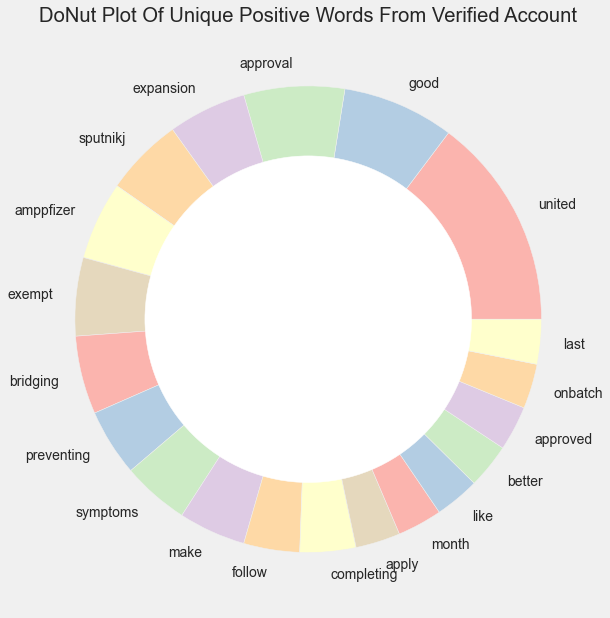

In [340]:
#Do Nut Plot of Unique positive Words from the verified account data set 
from palettable.colorbrewer.qualitative import Pastel1_7
plt.figure(figsize=(16,10))
my_circle=plt.Circle((0,0), 0.7, color='white')
plt.pie(Unique_Positive['count'], labels=Unique_Positive.words, colors=Pastel1_7.hex_colors)
p=plt.gcf()
p.gca().add_artist(my_circle)
plt.title('DoNut Plot Of Unique Positive Words From Verified Account')
plt.show()

## **Unique word in Negative Tweet From Verified Account**

In [348]:
## Top 20 Unique word for Negative Tweet in Verified Account
Unique_Negative= words_unique('negative', 20, rt)
print("Top 20 unique words in Negative Tweets From Verified Account:")
Unique_Negative.style.background_gradient(cmap='Blues')

Top 20 unique words in Negative Tweets From Verified Account:


,words,count
0,isnworse,4
1,video,4
2,explains,4
3,canjudge,4
4,morrison,3
5,comes,3
6,japan,3
7,breakthrough,2
8,infected,2
9,sick,2


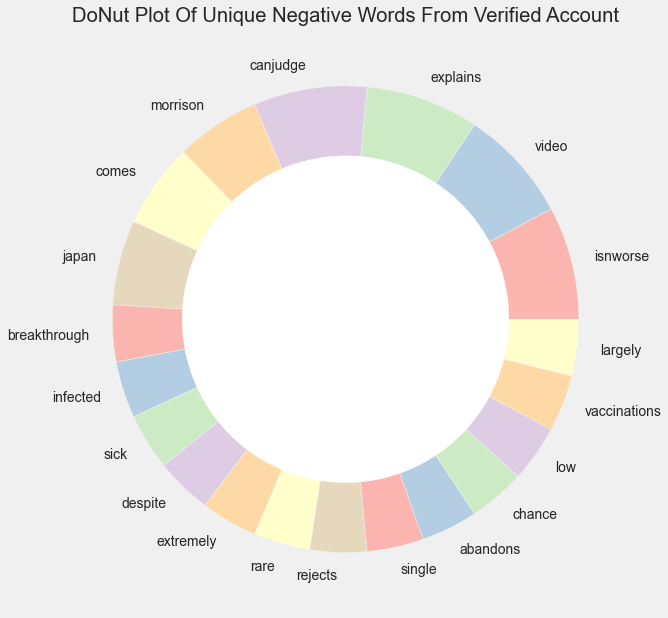

In [345]:
#Do Nut Plot of Unique Negative Words from the verified account data set
from palettable.colorbrewer.qualitative import Pastel1_7
plt.figure(figsize=(16,10))
my_circle=plt.Circle((0,0), 0.7, color='white')
plt.pie(Unique_Negative['count'], labels=Unique_Negative.words, colors=Pastel1_7.hex_colors)
p=plt.gcf()
p.gca().add_artist(my_circle)
plt.title('DoNut Plot Of Unique Negative Words From Verified Account')
plt.show()

## **Report :**
>>For Negative tweet for unique words, the table display low counts of unique words in Negative tweets and also the top unique words in Negative tweets are (isworse,video, and explain) with equal counts of 4 each 

## **Unique word in Neutral Tweet From Verified Account**

In [350]:
#Unique word for Neutral Tweet in Verified Account 
Unique_Neutral= words_unique('Neutral', 20, rt)
print("Top 20 unique words in Neutral Tweets From Verified Account:")
Unique_Neutral.style.background_gradient(cmap='Reds')

Top 20 unique words in Neutral Tweets From Verified Account:


,words,count
0,receive,15
1,allocated,12
2,kept,11
3,centers,11
4,control,11
5,prevention,11
6,economies,10
7,older,10
8,modernaco,10
9,abandonedgoal,9


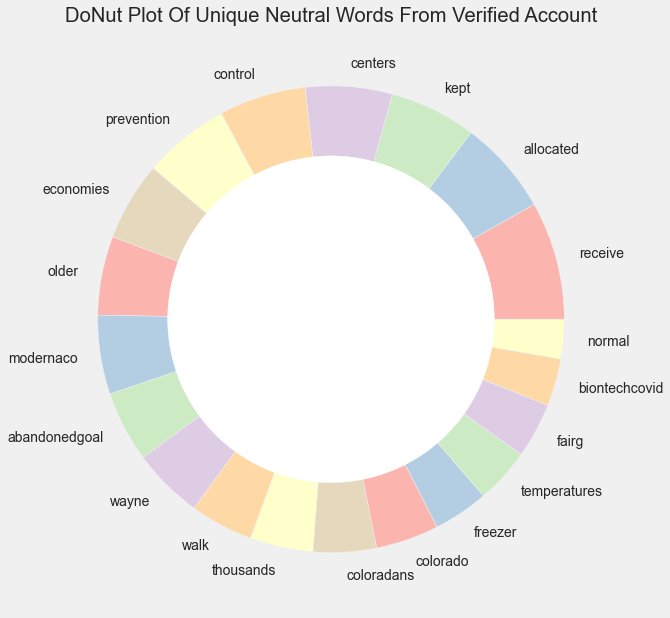

In [352]:
#Do Nut Plot of Unique Neutral Words from the verified account data set
from palettable.colorbrewer.qualitative import Pastel1_7
plt.figure(figsize=(16,10))
my_circle=plt.Circle((0,0), 0.7, color='white')
plt.pie(Unique_Neutral['count'], labels=Unique_Neutral.words, colors=Pastel1_7.hex_colors)
p=plt.gcf()
p.gca().add_artist(my_circle)
plt.title('DoNut Plot Of Unique Neutral Words From Verified Account')
plt.show()

## **Report :**
>The cells above displays the table and do Nut chart, which contain top 20 unique words in Neutral tweet of verified twitter account.
Its deduce from the table that the unique words **recieved** and **allocated** are the most unique words with (15 and 12) counts respectively, while the rest of the unique words display slight variability in the counts
>>The Do Nut chart confirm the report from the table with the graphical representation of the unique words of Neutral tweets, the size of the word on the chart is proportional to the counts from the table, 
and its display that unique word **recieved** and **allocated** have the biggest size of slice among others.

## Sentiment Wise of  Tweet By Locations 
This section present the words counts of the categories of sentiments considered in this study by location, the location is meaure by cities and state. this is done to inspect the cities and state with more postive, negative and neutral tweets, its will help to known the opinon of users via location.

In [415]:
#create positive, Neutral, and Negative dataframe
#nw_df['location']= nw_df['location'].fillna('Unknown')
pos_twt = nw_df[nw_df['sentiment'] == 'positive']
neg_twt = nw_df[nw_df['sentiment'] == 'negative']
neut_twt = nw_df[nw_df['sentiment'] == 'Neutral']

In [386]:
#It was noted from the brief (refer to ln (22))view of the data set that there exist missing value in the colums 'location'
#since the percentage of Nan by row is not up to 50% we decided to drop it for this section sake
nw_df = nw_df.dropna(axis = 0)

In [387]:
nw_df.columns

Index(['user_name', 'text', 'favorite_count', 'location', 'cl_tweet',
       'sent_neg', 'user_date', 'acct_veri', 'sources', 'sent_neu', 'sent_pos',
       'sent_comp', 'sentiment', 'twt'],
      dtype='object')

In [391]:
#The code is use to split the column location int0 two by (,) and create new colum for the two side 
nw_df['loca1'] = nw_df['location'].apply(lambda x: x.split(',')[0])
nw_df['loca2'] = nw_df['location'].apply(lambda x: x.split(',')[-1])

In [394]:
#the column 'loca1'will be use, so for uniformity str where change to upper case 
nw_df['loca1'] = nw_df.loca1.apply(lambda x: str (x).upper ())# Upper case

In [422]:
pos_twt.columns

Index(['user_name', 'text', 'favorite_count', 'location', 'cl_tweet',
       'sent_neg', 'user_date', 'acct_veri', 'sources', 'sent_neu', 'sent_pos',
       'sent_comp', 'sentiment', 'twt', 'loca1', 'loca2'],
      dtype='object')

In [457]:
# Most Countries with Positive Tweet
top_loc = pos_twt.groupby('loca1').count()['text'].sort_values(ascending = False)
loc_pos = pd.DataFrame(top_loc[:20]).reset_index()
loc_pos.columns = ['location','count']
loc_pos.style.background_gradient(cmap='Reds')

,location,count
0,NEW YORK,37
1,TORONTO,24
2,LONDON,21
3,DELHI,19
4,HOUSTON,13
5,LOS ANGELES,13
6,OHIO,13
7,MUMBAI,12
8,CALIFORNIA,11
9,MIAMI,10


In [458]:
#Tree Representation of the Most Country with Positive Tweet
fig = px.treemap(loc_pos, path=['location'], values='count',title='Tree Of Most States/Cities With Positive Tweet')
fig.show()

## **Report :**
>from the table to the bar chart, its noted that New York city has the most postive tweets count with (37) counts from the table follwed by Toronto, London, and Dehli with 
(24,21,19) counts respectively, while the rest of the cities/states are less than 15 counts.
this implies that user from New york, Toronto,London, and Dehli opinons are more positive

In [459]:
# Most Countries with Negative Tweet
top_loc = neg_twt.groupby('loca1').count()['text'].sort_values(ascending = False)
loc_neg = pd.DataFrame(top_loc[:20]).reset_index()
loc_neg.columns = ['location','count']
loc_neg.style.background_gradient(cmap='Greens')

,location,count
0,NEW YORK,13
1,LONDON,10
2,TORONTO,8
3,OHIO,7
4,DELHI,7
5,NORTH AMERICA,6
6,FLORIDA,6
7,US,6
8,WASHINGTON,5
9,SAN DIEGO,5


In [460]:
#Tree Representation of the Most Country with Positive Tweet
fig = px.treemap(loc_neg, path=['location'], values='count',title='Tree Of Most States/Cities With Negative Tweet')
fig.show()

##**Report :**
>considering the result from the table and tree chart above on Negative tweet, New york city also has more tweet in comparison with its counterpart
though the counts for negative is far less than that of positive tweet, which implies the inference drawn on positve tweet count by location result
Also **London**, **Toronto** and **Ohio** followed New york city with counts (10,8,7) respectively. the four citites have the largest tree map 
in the treemap chart above compare to other state/citties  

In [461]:
# Most Countries with Neutral Tweet
top_loc = neut_twt.groupby('loca1').count()['text'].sort_values(ascending = False)
loc_neu = pd.DataFrame(top_loc[:20]).reset_index()
loc_neu.columns = ['location','count']
loc_neu.style.background_gradient(cmap='Blues')

,location,count
0,NEW YORK,301
1,DELHI,88
2,TORONTO,49
3,LONDON,38
4,MUMBAI,23
5,LOS ANGELES,23
6,NEW DELHI,22
7,COLORADO,20
8,BENGALURU,19
9,OHIO,17


In [2]:
fig = px.treemap(loc_neu, path=['location'], values='count',title='Tree Of Most States/Cities With Neutral Tweet')
fig.show()

## **Report :**
>The table and chart show the top 30 count and treemap of most cities/states with Neutral tweets, from the table it was observed that
the general counts for neutral tweets by location in higher than that of positve and negative, this align with the report on sentiment analysis of the the twweets
without considering locations. Noted from the treemap, New york city also has more neutral tweets with 301 counts followed by Delhi with 88 counts 
and Toronto with (49), while the rest of the cities/states are less than 40 counts of tweets. 

## **General Report**
>From the point of sentiment analysis by sources all through to location, it was noted that more of tweets where central on neutral and positive 
sentiments which implies that the twitter user opinon are generally positive on the subject matter which is pfizer covid 19 vaccine .

## **THE END** 
## **THANKS**